# Mass Model Analysis

Diagnostic plots for the `2xlayers_b32` model.

Loads saved fold flows from `outputs/mass_model/2xlayers_b32/` — no retraining.

In [1]:
import sys
sys.path.insert(0, '../..')

import numpy as np
import pandas as pd
import torch
import pickle
import os
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

from training.constants  import LOGA_GRID, PRIOR_LOGPROT
from training.data       import load_training, make_holdout_split
from training.flow       import create_flow
from training.infer      import batch_posteriors
from training.metrics    import compute_residuals
from training.plots      import (
    set_paper_style, plot_posteriors_by_age, plot_fixed_mass_heatmap,
    plot_residual_panels, plot_cluster_residual_densities,
    plot_age_slices, plot_mass_slices, compute_prot_pdf,
    plot_praesepe_density,
)
from training.report     import coverage_report

set_paper_style()

MODEL_DIR   = '../../outputs/mass_model/2xlayers_b32'
N_FOLDS     = 5
OBS_COL     = 'log_prot'
COND_COLS   = ['log_age_myr', 'mass_msun', 'mass_msun_err_lo', 'mass_msun_err_hi']
HIDDEN      = (64, 64, 64, 64)

In [2]:
# Load data
df = load_training('../../cf_data/training_stars.csv', drop_nan_age_err=False)
train_val_df, test_df = make_holdout_split(df, test_frac=0.10)

# Load saved fold flows + scalers
fold_flows, fold_scalers = [], []
for i in range(N_FOLDS):
    flow = create_flow(n_cond=len(COND_COLS), hidden_features=HIDDEN)
    flow.load_state_dict(torch.load(f'{MODEL_DIR}/fold{i}_flow.pt', weights_only=True))
    flow.eval()
    fold_flows.append(flow)
    with open(f'{MODEL_DIR}/fold{i}_scaler.pkl', 'rb') as f:
        fold_scalers.append(pickle.load(f))

# Load saved k-fold results + posteriors
results_df       = pd.read_csv(f'{MODEL_DIR}/results.csv')
posteriors_kfold = np.load(f'{MODEL_DIR}/posteriors_kfold.npy')

print(f'Stars in train/val pool : {len(train_val_df)}')
print(f'Stars in test holdout   : {len(test_df)}')
print(f'K-fold results rows     : {len(results_df)}')
print(f'Posteriors shape        : {posteriors_kfold.shape}')

Stars in train/val pool : 5515
Stars in test holdout   : 613
K-fold results rows     : 5515
Posteriors shape        : (5515, 1000)


## 1. Density plots & model structure

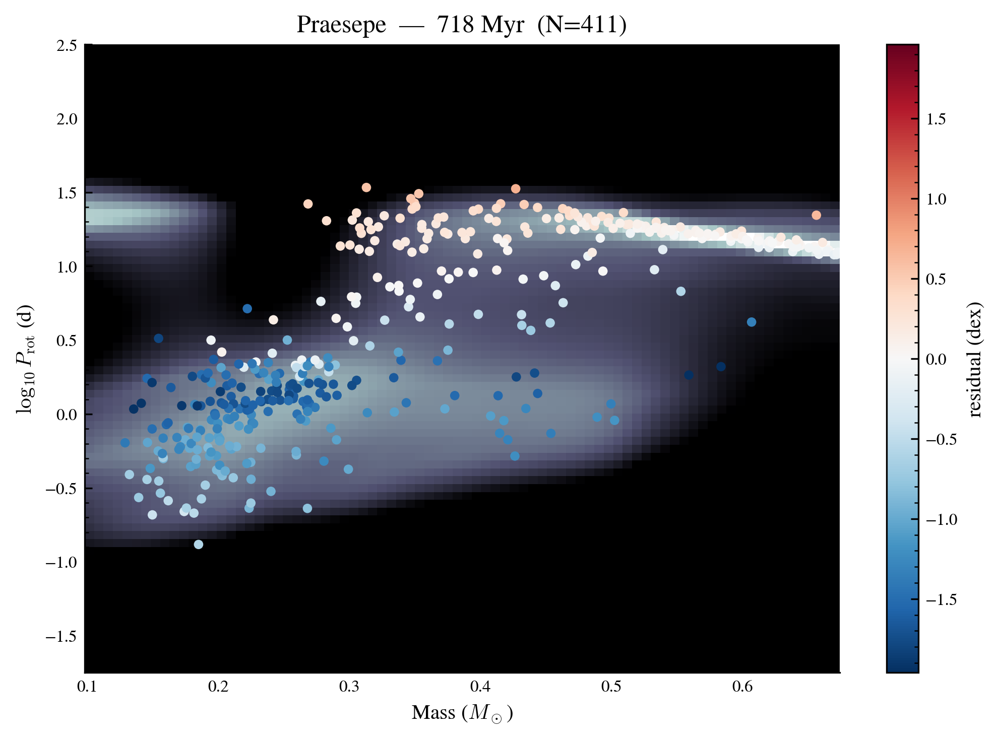

In [3]:
# 1a'. Praesepe (~660 Myr) cluster density — P(log_prot | tau_Praesepe, mass) heatmap
#      with actual Praesepe stars overlaid, colored by age residual.
plot_praesepe_density(fold_flows, train_val_df, results_df, COND_COLS, fold_scalers)

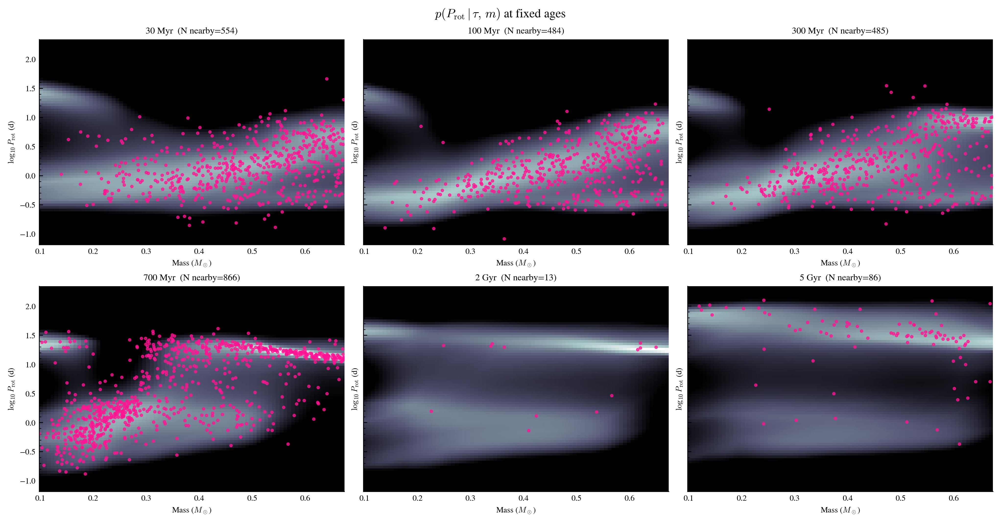

In [4]:
import importlib
import training.plots
importlib.reload(training.plots)
from training.plots import plot_age_slices, plot_mass_slices
# 1b. Slices in age: P_rot vs mass at fixed ages (training data overlaid)


plot_age_slices(
    fold_flows, fold_scalers, train_val_df, COND_COLS,
    ages_myr    = [30, 100, 300, 700, 2000, 5000],
    age_tol_dex = 0.10,
)

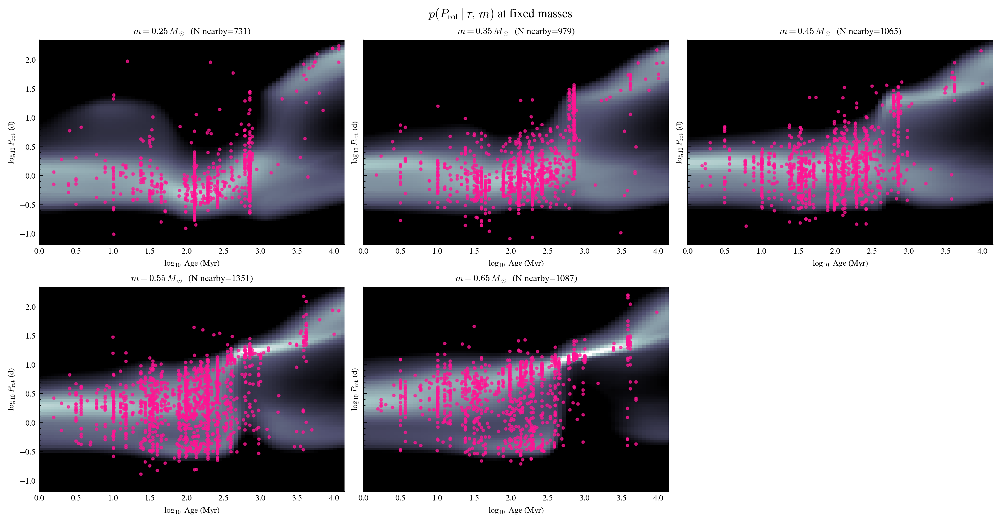

In [5]:
# 1c. Slices in mass (color): P_rot vs age at fixed masses
plot_mass_slices(
    fold_flows, fold_scalers, train_val_df, COND_COLS,
    masses   = [0.25, 0.35, 0.45, 0.55, 0.65],
    mass_tol = 0.05,
)

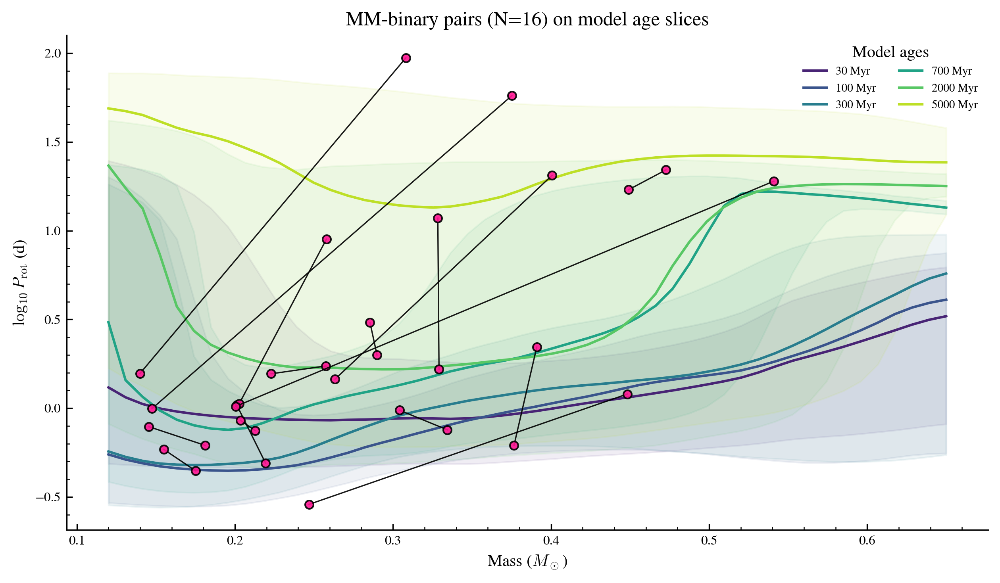

In [6]:
# 1d. Coeval MM-binary pairs (mmcoeval.csv) overlaid on model age slices.
#     Each pair shares an unknown age — both stars should land on the same model curve.
from scipy.spatial import cKDTree

_mm = pd.read_csv('../../cf_data/mmcoeval.csv')
_mm = _mm.dropna(subset=['mass_msun','prot_days','ra','dec',
                          'mass_msun_err_lo','mass_msun_err_hi']).reset_index(drop=True)

# Pair by sky proximity (MM pairs sit at arc-minute separations)
_xy      = np.column_stack([_mm['ra'].values, _mm['dec'].values])
_, _nn   = cKDTree(_xy).query(_xy, k=2)
_partner = _nn[:, 1]
_pair_id = np.array([min(i, _partner[i]) for i in range(len(_mm))])

# Prepare for inference (used by the next cell)
_mm['log_prot']    = np.log10(_mm['prot_days'])
_mm['log_age_myr'] = 3.0  # placeholder; batch_posteriors sweeps this

# Model: median + 16/84 P_rot vs mass at several reference ages
_ref_ages   = [30, 100, 300, 700, 2000, 5000]
_mass_grid  = np.linspace(0.12, 0.65, 50)
_age_colors = plt.cm.viridis(np.linspace(0.1, 0.9, len(_ref_ages)))

fig, ax = plt.subplots(figsize=(8.5, 5))
for age_myr, col in zip(_ref_ages, _age_colors):
    med, lo, hi = [], [], []
    for mass in _mass_grid:
        lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                    COND_COLS, train_val_df, res=200)
        cdf = np.cumsum(pdf); cdf /= cdf[-1]
        med.append(np.interp(0.50, cdf, lp))
        lo .append(np.interp(0.16, cdf, lp))
        hi .append(np.interp(0.84, cdf, lp))
    ax.plot(_mass_grid, med, color=col, lw=1.5, label=f'{age_myr} Myr')
    ax.fill_between(_mass_grid, lo, hi, color=col, alpha=0.08)

_n_pairs = 0
for pid in np.unique(_pair_id):
    sub = _mm[_pair_id == pid]
    if len(sub) == 2:
        _n_pairs += 1
        ax.plot(sub['mass_msun'].values, np.log10(sub['prot_days'].values),
                'o-', color='black', mfc='deeppink', mec='black',
                lw=0.8, ms=5, alpha=0.9)

ax.set_xlabel(r'Mass ($M_\odot$)')
ax.set_ylabel(r'$\log_{10} P_\mathrm{rot}$ (d)')
ax.set_title(f'MM-binary pairs (N={_n_pairs}) on model age slices')
ax.legend(fontsize=7, frameon=False, ncol=2, title='Model ages')
plt.tight_layout()
plt.show()

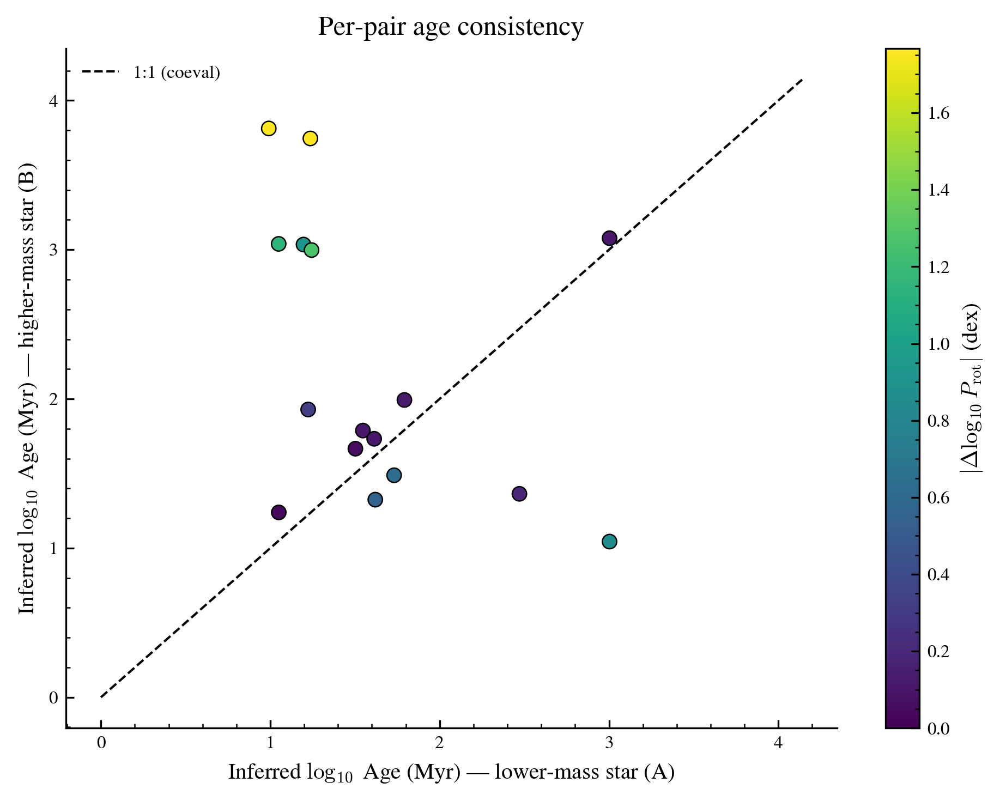

In [7]:
# 1e. Per-pair age consistency: inferred age of star A vs star B for each MM pair.
#     If the model gives coeval predictions for coeval stars, points fall on the 1:1 line.
#     Color encodes |Δ log P_rot| within the pair — pairs with similar rotation periods
#     *must* land on 1:1 if the model is internally consistent; pairs with very different
#     periods are allowed to scatter (one star on fast sequence, the other on slow).
_posts_mm = np.mean([
    batch_posteriors(flow, _mm, OBS_COL, COND_COLS, scaler, log_prior_fn=None)
    for flow, scaler in zip(fold_flows, fold_scalers)
], axis=0)
_p50_mm = np.array([np.interp(0.5, np.cumsum(p)/np.sum(p), LOGA_GRID) for p in _posts_mm])

ages_A, ages_B, dlogprot = [], [], []
for pid in np.unique(_pair_id):
    idxs = np.where(_pair_id == pid)[0]
    if len(idxs) != 2:
        continue
    i_A, i_B = sorted(idxs, key=lambda i: _mm.iloc[i]['mass_msun'])
    ages_A.append(_p50_mm[i_A])
    ages_B.append(_p50_mm[i_B])
    dlogprot.append(abs(np.log10(_mm.iloc[i_A]['prot_days']) -
                        np.log10(_mm.iloc[i_B]['prot_days'])))
ages_A, ages_B, dlogprot = np.array(ages_A), np.array(ages_B), np.array(dlogprot)

fig, ax = plt.subplots(figsize=(6.5, 5))
_lo, _hi = LOGA_GRID[0], LOGA_GRID[-1]
ax.plot([_lo, _hi], [_lo, _hi], 'k--', lw=1, label='1:1 (coeval)')
sc = ax.scatter(ages_A, ages_B, c=dlogprot, cmap='viridis', s=40,
                edgecolors='black', linewidths=0.6, zorder=2,
                vmin=0, vmax=np.percentile(dlogprot, 95))
plt.colorbar(sc, ax=ax, label=r'$|\Delta \log_{10} P_\mathrm{rot}|$ (dex)')
ax.set_xlabel(r'Inferred $\log_{10}$ Age (Myr) — lower-mass star (A)')
ax.set_ylabel(r'Inferred $\log_{10}$ Age (Myr) — higher-mass star (B)')
ax.set_title('Per-pair age consistency')
ax.legend(fontsize=8, frameon=False)
plt.tight_layout()
plt.show()

## 2. Age recovery

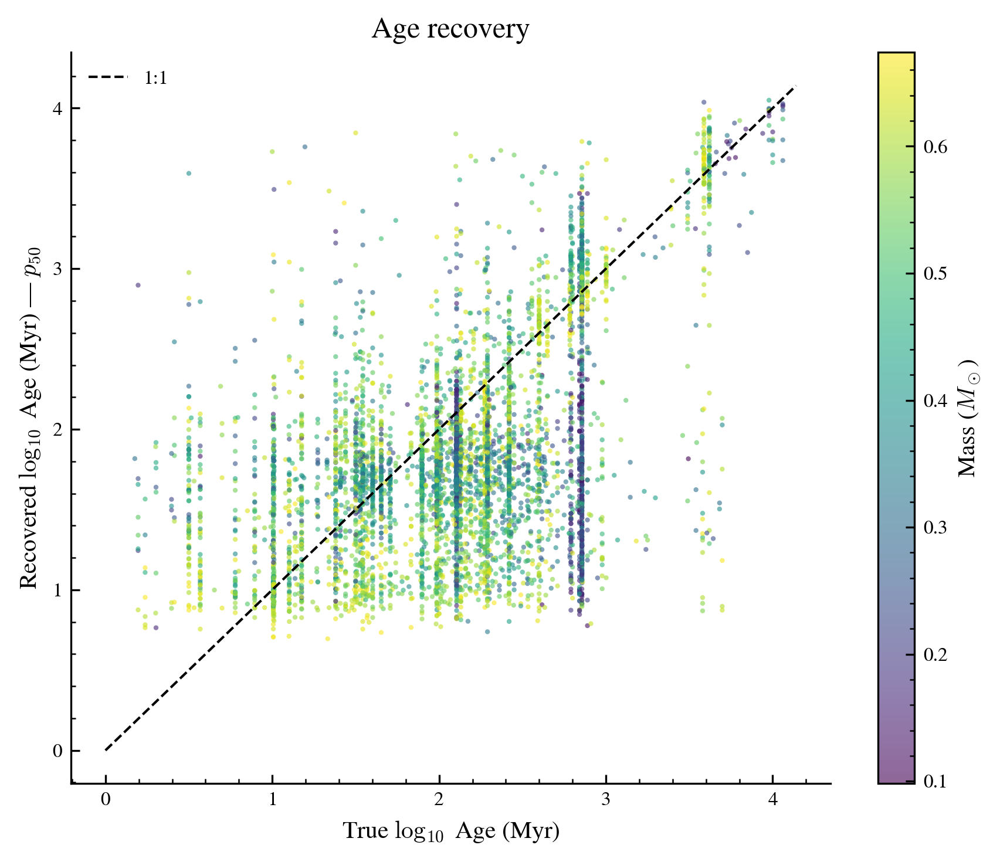

=== 68% posterior coverage check ===
N valid stars       : 5515
Observed coverage   : 0.824 (82.4%)
Expected coverage   : 0.680 +/- 0.006 (binomial 1-sigma)
Coverage offset     : +22.89 sigma
Interpretation      : over-covering; posteriors are likely too broad / conservative.


,cover68,n
fold,,
0,0.823209,1103
1,0.817770,1103
2,0.807797,1103
3,0.830462,1103
4,0.839529,1103


In [8]:
# True vs recovered age scatter (k-fold val set), colored by mass
fig, ax = plt.subplots(figsize=(6, 5))
sc = ax.scatter(results_df['log_age_myr'], results_df['p50'],
                c=results_df['mass_msun'], cmap='viridis',
                s=4, alpha=0.6, linewidths=0)
ax.plot([LOGA_GRID[0], LOGA_GRID[-1]], [LOGA_GRID[0], LOGA_GRID[-1]],
        'k--', lw=1, label='1:1')
ax.set_xlabel(r'True $\log_{10}$ Age (Myr)')
ax.set_ylabel(r'Recovered $\log_{10}$ Age (Myr) — $p_{50}$')
ax.set_title('Age recovery')
plt.colorbar(sc, ax=ax, label=r'Mass ($M_\odot$)')
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

coverage_report(results_df)

## 4. Sample age posteriors

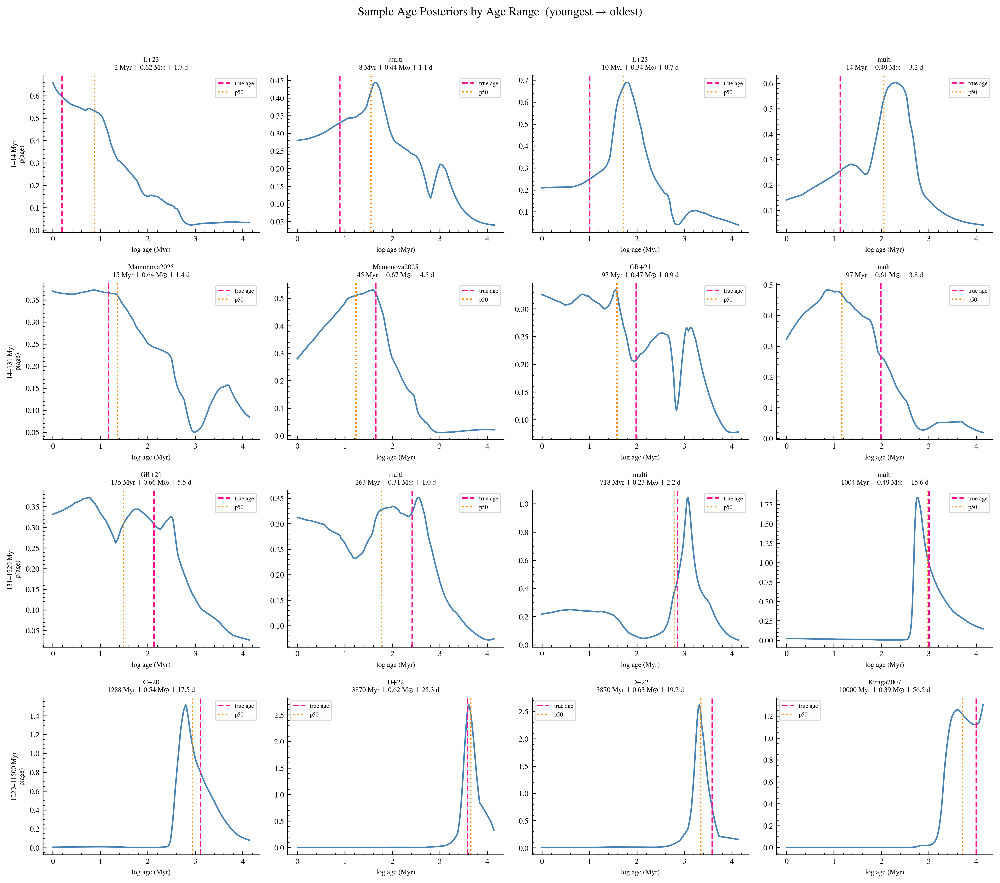

In [9]:
# 4a. 4×4 grid across the k-fold val set, organised by age range
plot_posteriors_by_age(posteriors_kfold, LOGA_GRID, results_df, n_rows=4, n_cols=4)

Young slow rotators found: 103


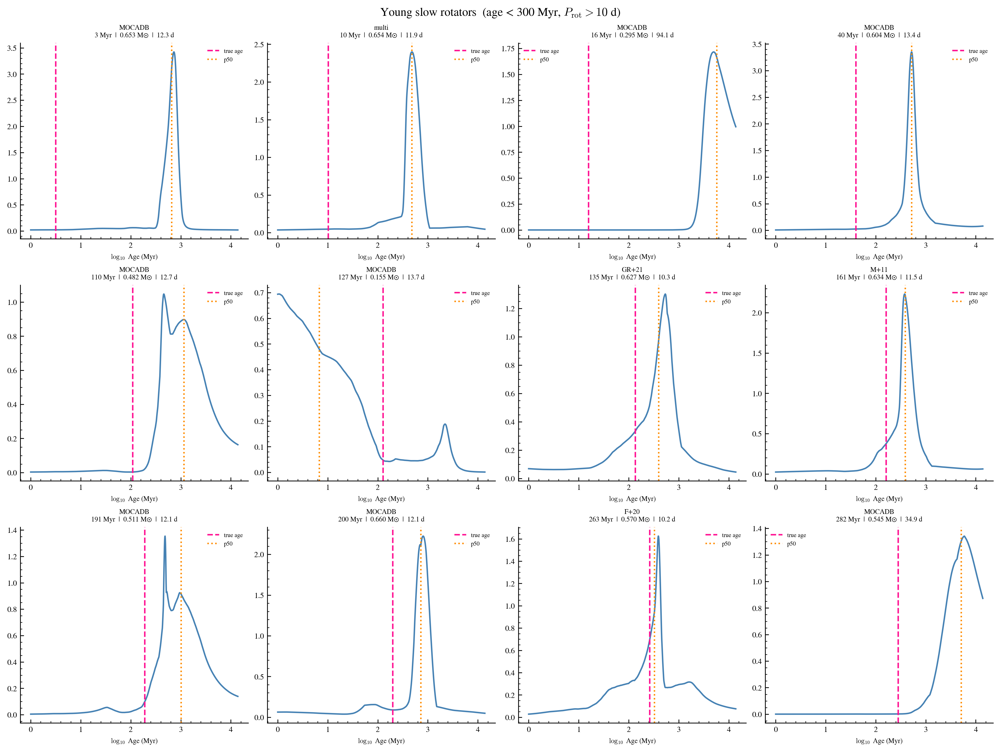

In [10]:
# 4c. Young slow rotators (age < 300 Myr, P_rot > 10 d) — held-out posteriors
yr_mask = (results_df['log_age_myr'] < np.log10(300)) & (results_df['prot_days'] > 10)
yr_df   = results_df[yr_mask].copy().reset_index(drop=True)
yr_pos  = np.where(yr_mask.values)[0]

print(f'Young slow rotators found: {len(yr_df)}')

n_pick = min(12, len(yr_df))
age_order = np.argsort(yr_df['log_age_myr'].values)
pick      = age_order[np.linspace(0, len(age_order) - 1, n_pick, dtype=int)]

n_cols = 4
n_rows = int(np.ceil(n_pick / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 3.5), layout='constrained')
axes = np.array(axes).flatten()
for ax, i in zip(axes, pick):
    row  = yr_df.iloc[i]
    pidx = yr_pos[i]
    ax.plot(LOGA_GRID, posteriors_kfold[pidx], color='steelblue', lw=1.5)
    ax.axvline(row['log_age_myr'], color='deeppink',  lw=1.5, ls='--', label='true age')
    ax.axvline(row['p50'],         color='darkorange', lw=1.5, ls=':',  label='p50')
    ax.set_title(
        f"{row['source_paper']}\n"
        f"{10**row['log_age_myr']:.0f} Myr  |  {row['mass_msun']:.3f} M☉  |  {row['prot_days']:.1f} d",
        fontsize=7,
    )
    ax.set_xlabel(r'$\log_{10}$ Age (Myr)', fontsize=7)
    ax.legend(fontsize=6, frameon=False)
for ax in axes[n_pick:]:
    ax.set_visible(False)
fig.suptitle(r'Young slow rotators  (age < 300 Myr, $P_\mathrm{rot} > 10$ d)')
plt.show()

Low-mass fast rotators: 1764
Age range: 1 – 4981 Myr


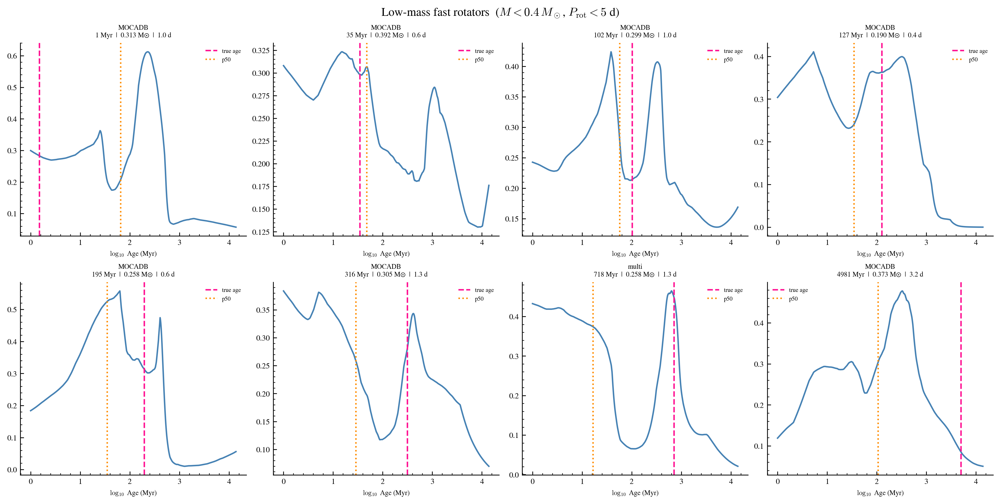

In [11]:
# 4d. Low-mass fast rotators (M < 0.4 M☉, P_rot < 5 d) — held-out posteriors
lmfr_mask = (results_df['mass_msun'] < 0.4) & (results_df['prot_days'] < 5)
lmfr_df   = results_df[lmfr_mask].copy().reset_index(drop=True)
lmfr_pos  = np.where(lmfr_mask.values)[0]

print(f'Low-mass fast rotators: {len(lmfr_df)}')
print(f'Age range: {10**lmfr_df["log_age_myr"].min():.0f} – {10**lmfr_df["log_age_myr"].max():.0f} Myr')

n_pick = min(8, len(lmfr_df))
age_order = np.argsort(lmfr_df['log_age_myr'].values)
pick      = age_order[np.linspace(0, len(age_order) - 1, n_pick, dtype=int)]

n_cols = 4
n_rows = int(np.ceil(n_pick / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 3.5), layout='constrained')
axes = np.array(axes).flatten()
for ax, i in zip(axes, pick):
    row  = lmfr_df.iloc[i]
    pidx = lmfr_pos[i]
    ax.plot(LOGA_GRID, posteriors_kfold[pidx], color='steelblue', lw=1.5)
    ax.axvline(row['log_age_myr'], color='deeppink',  lw=1.5, ls='--', label='true age')
    ax.axvline(row['p50'],         color='darkorange', lw=1.5, ls=':',  label='p50')
    ax.set_title(
        f"{row['source_paper']}\n"
        f"{10**row['log_age_myr']:.0f} Myr  |  {row['mass_msun']:.3f} M☉  |  {row['prot_days']:.1f} d",
        fontsize=7,
    )
    ax.set_xlabel(r'$\log_{10}$ Age (Myr)', fontsize=7)
    ax.legend(fontsize=6, frameon=False)
for ax in axes[n_pick:]:
    ax.set_visible(False)
fig.suptitle(r'Low-mass fast rotators  ($M < 0.4\,M_\odot$, $P_\mathrm{rot} < 5$ d)')
plt.show()

## 5. Residual analysis

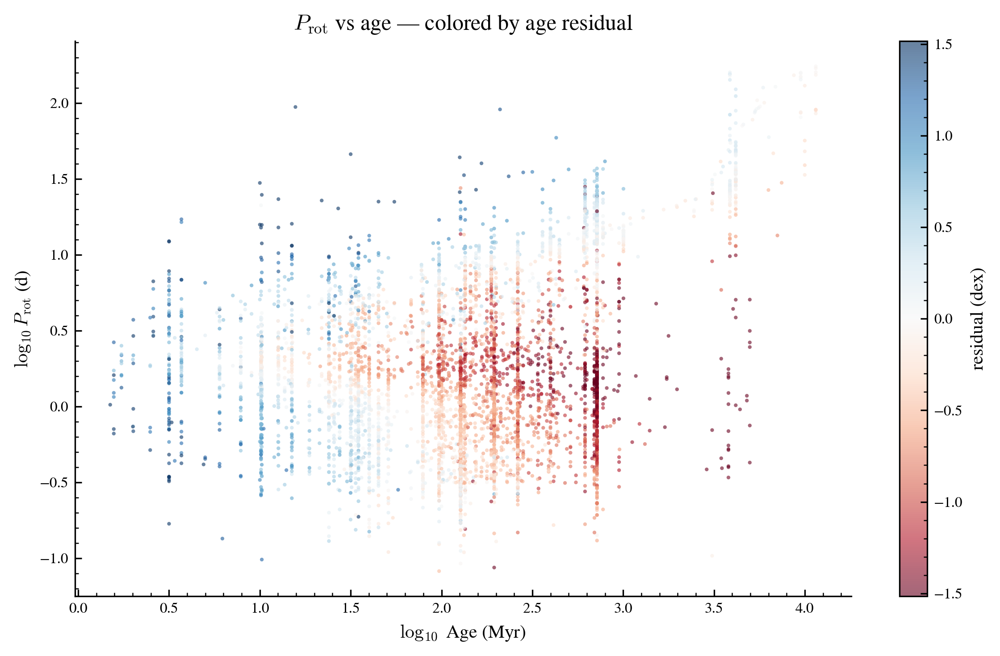

In [12]:
# 5b. P_rot vs age scatter, color-coded by residual
fig, ax = plt.subplots(figsize=(8, 5))
vlim = results_df['residual_dex'].abs().quantile(0.95)
sc = ax.scatter(
    results_df['log_age_myr'], results_df['log_prot'],
    c=results_df['residual_dex'], cmap='RdBu',
    vmin=-vlim, vmax=vlim, s=4, alpha=0.6, linewidths=0,
)
plt.colorbar(sc, ax=ax, label='residual (dex)')
ax.set_xlabel(r'$\log_{10}$ Age (Myr)')
ax.set_ylabel(r'$\log_{10} P_\mathrm{rot}$ (d)')
ax.set_title(r'$P_\mathrm{rot}$ vs age — colored by age residual')
plt.tight_layout()
plt.show()

## 6. Precision & accuracy maps

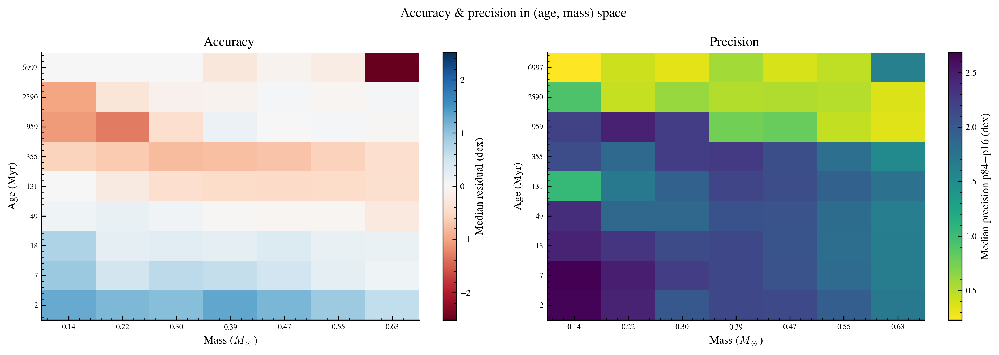

In [13]:
_rd = results_df.copy()
_rd['precision'] = _rd['p84'] - _rd['p16']

age_bins  = np.linspace(_rd['log_age_myr'].min(), _rd['log_age_myr'].max(), 10)
mass_bins = np.linspace(_rd['mass_msun'].min(),   _rd['mass_msun'].max(),   8)

MIN_N = 1

acc_grid  = np.full((len(age_bins)-1, len(mass_bins)-1), np.nan)
prec_grid = acc_grid.copy()
n_grid    = np.zeros_like(acc_grid)

for i in range(len(age_bins)-1):
    for j in range(len(mass_bins)-1):
        mask = (
            (_rd['log_age_myr'] >= age_bins[i])  & (_rd['log_age_myr'] < age_bins[i+1]) &
            (_rd['mass_msun']   >= mass_bins[j])  & (_rd['mass_msun']   < mass_bins[j+1])
        )
        n_grid[i, j] = mask.sum()
        if mask.sum() >= MIN_N:
            acc_grid[i, j]  = _rd.loc[mask, 'residual_dex'].median()
            prec_grid[i, j] = _rd.loc[mask, 'precision'].median()

age_ctrs  = 0.5 * (age_bins[:-1] + age_bins[1:])
mass_ctrs = 0.5 * (mass_bins[:-1] + mass_bins[1:])
age_labels  = [f'{10**a:.0f}' for a in age_ctrs]
mass_labels = [f'{m:.2f}' for m in mass_ctrs]

fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

vlim = np.nanmax(np.abs(acc_grid))
im0 = axes[0].imshow(acc_grid, origin='lower', aspect='auto', cmap='RdBu',
                      vmin=-vlim, vmax=vlim)
plt.colorbar(im0, ax=axes[0], label='Median residual (dex)')
axes[0].set_xticks(range(len(mass_ctrs))); axes[0].set_xticklabels(mass_labels, fontsize=7)
axes[0].set_yticks(range(len(age_ctrs)));  axes[0].set_yticklabels(age_labels,  fontsize=7)
axes[0].set_xlabel(r'Mass ($M_\odot$)')
axes[0].set_ylabel('Age (Myr)')
axes[0].set_title(f'Accuracy ')

im1 = axes[1].imshow(prec_grid, origin='lower', aspect='auto', cmap='viridis_r')
plt.colorbar(im1, ax=axes[1], label='Median precision p84−p16 (dex)')
axes[1].set_xticks(range(len(mass_ctrs))); axes[1].set_xticklabels(mass_labels, fontsize=7)
axes[1].set_yticks(range(len(age_ctrs)));  axes[1].set_yticklabels(age_labels,  fontsize=7)
axes[1].set_xlabel(r'Mass ($M_\odot$)')
axes[1].set_ylabel('Age (Myr)')
axes[1].set_title(f'Precision ')

plt.suptitle('Accuracy & precision in (age, mass) space')
plt.tight_layout()
plt.show()

## 7. Fast vs slow rotator analysis

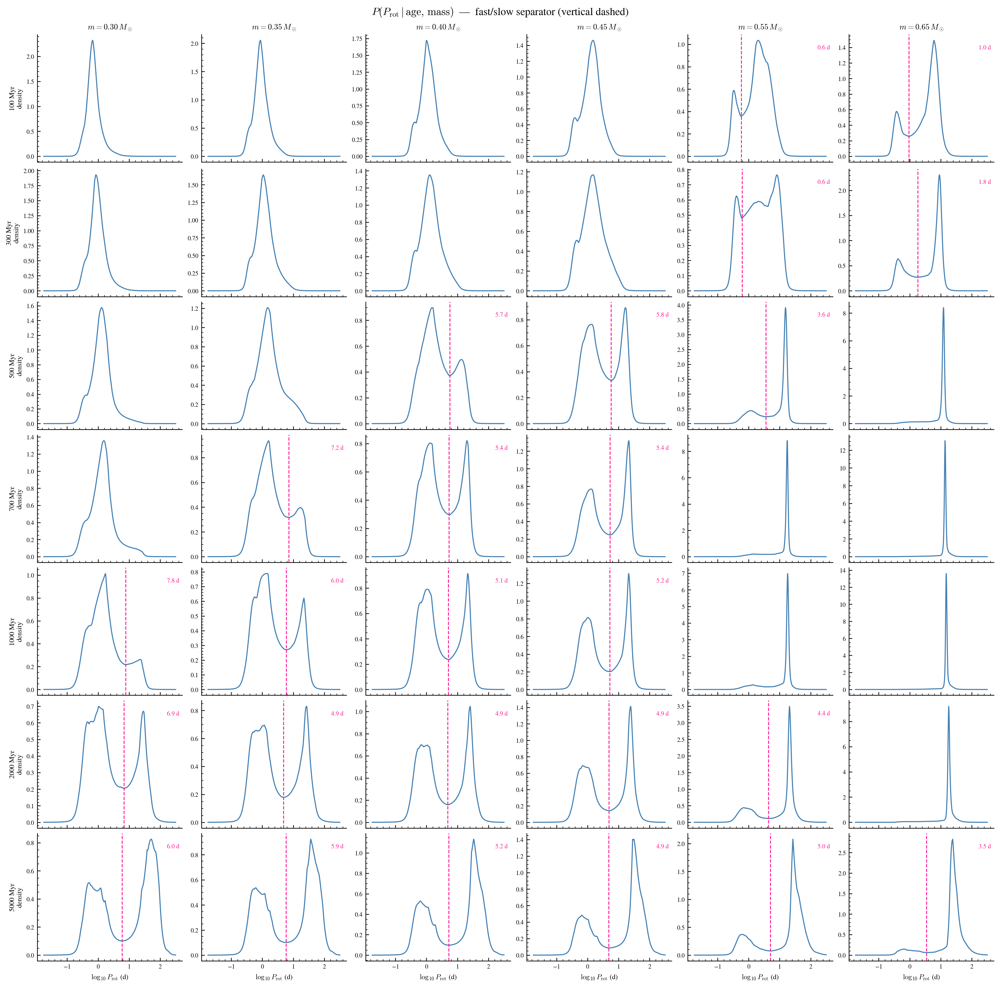

In [14]:
import importlib, training.plots
importlib.reload(training.plots)
from training.plots import compute_prot_pdf
# 7a. P_rot PDFs across (age × mass) — find min between leftmost & rightmost prominent peaks
from scipy.signal import find_peaks, savgol_filter

_ages_grid   = [100, 300, 500, 700, 1000, 2000, 5000]   # log-ish spaced, anchored to benchmark ages
_masses_grid = [0.30, 0.35, 0.40, 0.45, 0.55, 0.65]   # cols
logprot_fine = np.linspace(PRIOR_LOGPROT[0], PRIOR_LOGPROT[1], 500)

def _find_separator(pdf):
    smooth = savgol_filter(pdf, window_length=21, polyorder=3)
    peaks, _ = find_peaks(smooth,
                          height=0.03 * smooth.max(),
                          distance=20,
                          prominence=0.03 * smooth.max())
    if len(peaks) < 2:
        return None
    lo, hi = int(peaks.min()), int(peaks.max())
    return lo + int(np.argmin(smooth[lo:hi + 1]))

n_rows, n_cols = len(_ages_grid), len(_masses_grid)
fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(2.6 * n_cols, 2.2 * n_rows),
                          sharex=True, layout='constrained')

separators_grid = {}   # (age_myr, mass) -> log_prot separator
separators      = {}   # mass -> separator at 1000 Myr (used by 7b)

for i, age_myr in enumerate(_ages_grid):
    for j, mass in enumerate(_masses_grid):
        ax = axes[i, j]
        _, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                   COND_COLS, train_val_df, logprot_fine)
        ax.plot(logprot_fine, pdf, color='steelblue', lw=1.2)

        idx = _find_separator(pdf)
        if idx is not None:
            sep = float(logprot_fine[idx])
            separators_grid[(age_myr, mass)] = sep
            if age_myr == 1000:
                separators[mass] = sep
            ax.axvline(sep, color='deeppink', lw=1.0, ls='--')
            ax.text(0.98, 0.92, f'{10**sep:.1f} d', transform=ax.transAxes,
                    ha='right', va='top', fontsize=7, color='deeppink')

        if i == 0:
            ax.set_title(f'$m={mass:.2f}\\,M_\\odot$', fontsize=9)
        if j == 0:
            ax.set_ylabel(f'{age_myr} Myr\ndensity', fontsize=8)
        if i == n_rows - 1:
            ax.set_xlabel(r'$\log_{10} P_\mathrm{rot}$ (d)', fontsize=8)
        ax.tick_params(labelsize=7)

fig.suptitle(r'$P(P_\mathrm{rot}\,|\,\mathrm{age,\,mass})$  —  fast/slow separator (vertical dashed)')
plt.show()

# 7a. what this cell does:
#   - for each (age, mass) in the grid, ask the flow for P(log_prot | age, mass).
#   - smooth the pdf, run scipy.find_peaks to detect modes.
#   - if >= 2 peaks: mark the valley between the leftmost and rightmost peaks
#     as the fast/slow separator (the vertical pink dashed line).
#   - if 1 peak: label "unimodal" — no separator defined.
#   - stash the 1 gyr separators in `separators[mass]` for use in cell 7c.
# what it shows: the model's predicted rotation-period distribution at each
# (age, mass), and where the model places the natural fast/slow boundary.


# testing idea of looking at the learned rotation period distribution 
# across a grid of fixed ages 
# model has learned bimodal spindown
# If the distribution if bimodal, find the minimum between the two peaks
# as the separator between fast and slow rotators at that age and mass
# integrate the left side for the fast rotator fraction that the
# model expects at that age and mass
# left to right, masses increasing from 0.35 to 0.65
# top to botom, ages increasing from 100 Myr to 3000
# at the FCB (0.35, 0.45) solar masses, even at 3000 Myr the model learns bimodality

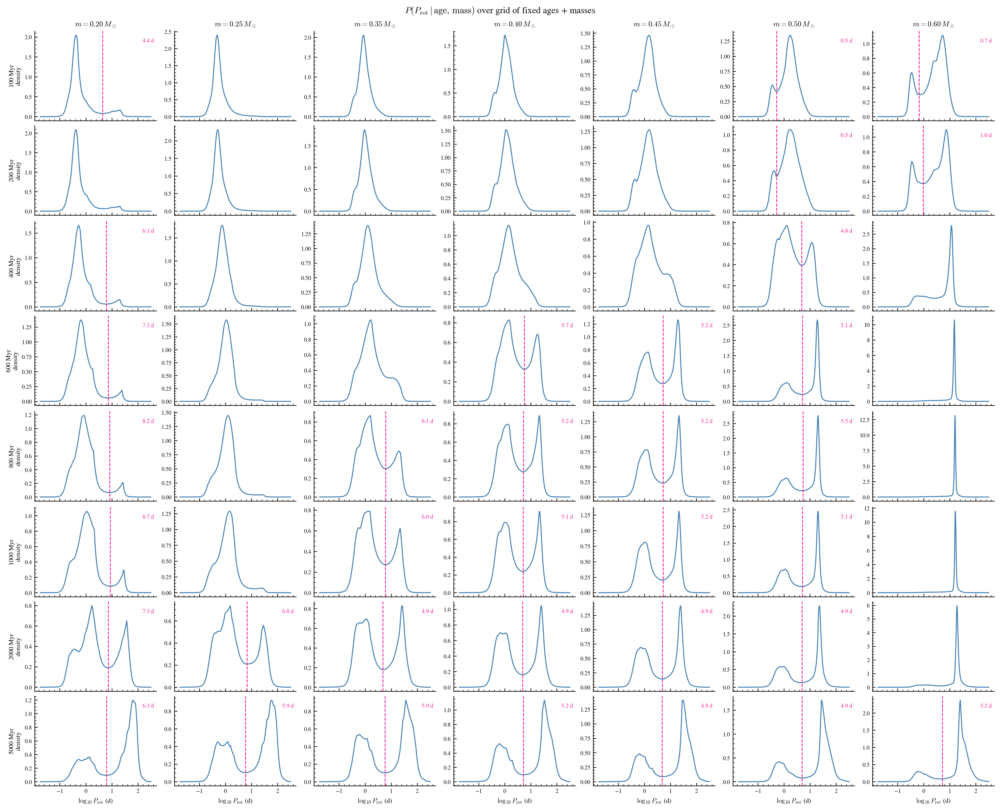

In [15]:
# 7a (full): presentation version — fine age resolution from 400 to 1000 Myr in
# 100 Myr steps, with young/old anchor ages. shows where bimodality emerges in detail.

_ages_full   = [100, 200, 400, 600, 800, 1000, 2000, 5000]
_masses_full = [0.2,0.25, 0.35, 0.4, 0.45, 0.5, 0.6]  # reuse the same mass set as compact 7a

n_rows, n_cols = len(_ages_full), len(_masses_full)
fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(2.4 * n_cols, 1.7 * n_rows),
                          sharex=True, layout='constrained')

for i, age_myr in enumerate(_ages_full):
    for j, mass in enumerate(_masses_full):
        ax = axes[i, j]
        _, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                   COND_COLS, train_val_df, logprot_fine)
        ax.plot(logprot_fine, pdf, color='steelblue', lw=1.2)

        idx = _find_separator(pdf)
        if idx is not None:
            sep = float(logprot_fine[idx])
            ax.axvline(sep, color='deeppink', lw=1.0, ls='--')
            ax.text(0.98, 0.92, f'{10**sep:.1f} d', transform=ax.transAxes,
                    ha='right', va='top', fontsize=7, color='deeppink')

        if i == 0:
            ax.set_title(f'$m={mass:.2f}\\,M_\\odot$', fontsize=9)
        if j == 0:
            ax.set_ylabel(f'{age_myr} Myr\ndensity', fontsize=8)
        if i == n_rows - 1:
            ax.set_xlabel(r'$\log_{10} P_\mathrm{rot}$ (d)', fontsize=8)
        ax.tick_params(labelsize=7)

fig.suptitle(r'$P(P_\mathrm{rot}\,|\,\mathrm{age,\,mass})$ over grid of fixed ages + masses',
             fontsize=11)
plt.show()

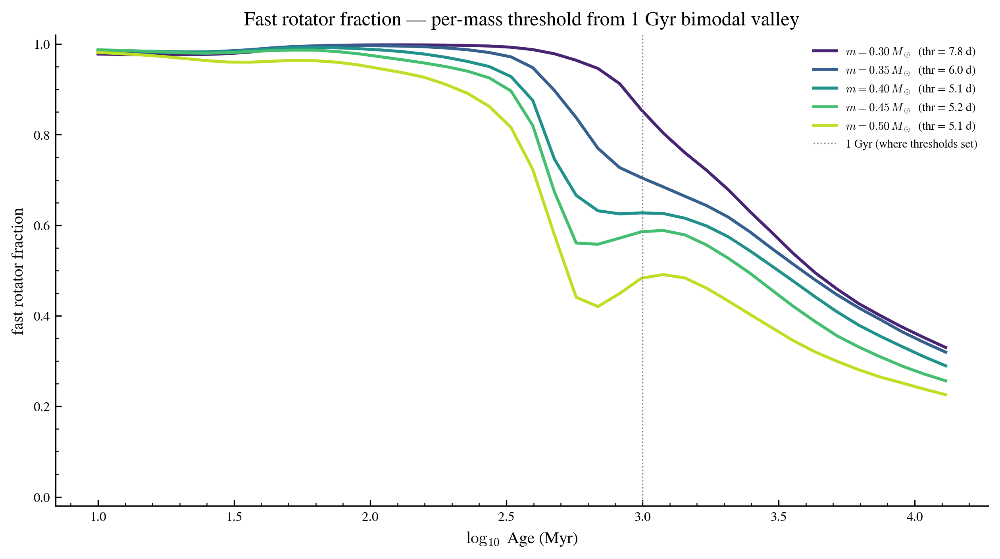

In [16]:
# 7b. Fast rotator fraction vs age — per-mass threshold from each mass's 1 Gyr valley.
_ages_myr        = np.logspace(1, np.log10(13000), 40)
_masses_7c       = [0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60, 0.65]
_threshold_age   = 1000.0   # Myr — where the per-mass valley is taken from

def threshold_at_1gyr(mass):
    _, pdf = compute_prot_pdf(fold_flows, fold_scalers, _threshold_age, mass,
                               COND_COLS, train_val_df, logprot_fine)
    idx = _find_separator(pdf)
    return float(logprot_fine[idx]) if idx is not None else None

mass_thresholds = {m: t for m in _masses_7c if (t := threshold_at_1gyr(m)) is not None}

_masses_plot = [m for m in _masses_7c if m in mass_thresholds]
_colors_7c   = plt.cm.viridis(np.linspace(0.1, 0.9, len(_masses_plot)))

def fast_fraction_mass_thr(age_myr, mass, threshold_log):
    lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                COND_COLS, train_val_df, logprot_fine)
    mask = lp <= threshold_log
    if mask.sum() < 2:
        return 0.0
    return float(np.clip(np.trapz(pdf[mask], lp[mask]), 0, 1))

fig, ax = plt.subplots(figsize=(8.5, 4.8))
for mass, col in zip(_masses_plot, _colors_7c):
    thr_log = mass_thresholds[mass]
    fracs   = [fast_fraction_mass_thr(a, mass, thr_log) for a in _ages_myr]
    ax.plot(np.log10(_ages_myr), fracs, color=col, lw=1.8,
            label=f'$m={mass:.2f}\\,M_\\odot$  (thr = {10**thr_log:.1f} d)')

ax.axvline(3.0, color='gray', lw=0.8, ls=':', label='1 Gyr (where thresholds set)')
ax.set_xlabel(r'$\log_{10}$ Age (Myr)')
ax.set_ylabel('fast rotator fraction')
ax.set_title('Fast rotator fraction — per-mass threshold from 1 Gyr bimodal valley')
ax.legend(fontsize=7, frameon=False, loc='upper right')
ax.set_ylim(-0.02, 1.02)
plt.tight_layout()
plt.show()
# 7c. what this cell does:
#   - for each mass, compute the model's pdf at age=1 gyr and find the bimodal valley.
#   - use that valley as the per-mass fast/slow threshold.
#   - sweep age, integrate the pdf below the per-mass threshold at each age.
# what it shows: same idea as 7b but with a mass-dependent threshold — each mass
# gets its own fast/slow boundary defined by where the model places the valley
# between c-sequence and i-sequence at 1 gyr. masses where 1 gyr is unimodal
# are skipped (model has either not yet split or already fully converged).




# for each mass, we look at the learned rotation distribution
# at 1 Gyr. then we find the separator between the two peaks
# if it exists, and then we use that as the threshold
# for all ages. 
# here, we see the trend that higher mass has 
# a lower fast rotator fraction overall across all ages

# try separator vs age


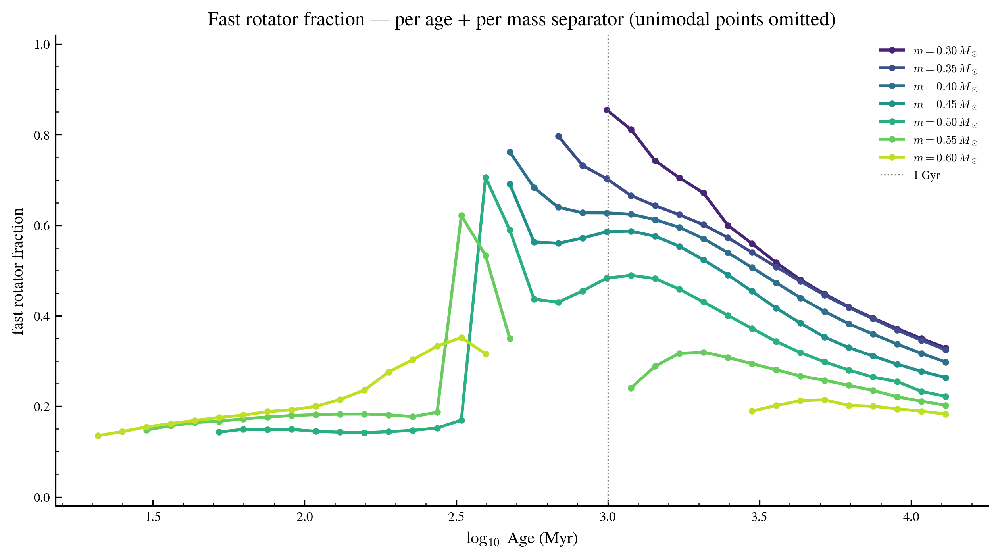

In [17]:
# 7e. what this cell does:
#   - for each mass curve, sweep age on the x-axis.
#   - at each (age, mass), try to find a bimodal valley in the pdf.
#   - if found: integrate the pdf to the left of that age-specific valley.
#   - if unimodal: omit the point (no fallback).
# what it shows: how the model partitions fast vs slow at every age, using
# the model's *own* valley at each age. threshold slides with age, so the
# y-axis is "fraction left of this-age's valley" — not directly comparable
# across ages, but useful to see where bimodality even exists in the model.
# gaps in curves = ages where the model's pdf is unimodal.

# 7e. Fast rotator fraction vs age — per-age, per-mass separator. Omit unimodal points.
_masses_7e = [0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6]
_colors_7e = plt.cm.viridis(np.linspace(0.1, 0.9, len(_masses_7e)))

def fast_fraction_sliding(age_myr, mass):
    lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                COND_COLS, train_val_df, logprot_fine)
    idx = _find_separator(pdf)
    if idx is None:
        return np.nan
    threshold_log = float(lp[idx])
    mask = lp <= threshold_log
    if mask.sum() < 2:
        return np.nan
    return float(np.clip(np.trapz(pdf[mask], lp[mask]), 0, 1))

fig, ax = plt.subplots(figsize=(8.5, 4.8))
for mass, col in zip(_masses_7e, _colors_7e):
    fracs = np.array([fast_fraction_sliding(a, mass) for a in _ages_myr])
    logage = np.log10(_ages_myr)
    ax.plot(logage, fracs, color=col, lw=1.8, marker='o', ms=3,
            label=f'$m={mass:.2f}\\,M_\\odot$')

ax.axvline(3.0, color='gray', lw=0.8, ls=':', label='1 Gyr')
ax.set_xlabel(r'$\log_{10}$ Age (Myr)')
ax.set_ylabel('fast rotator fraction')
ax.set_title('Fast rotator fraction — per age + per mass separator (unimodal points omitted)')
ax.legend(fontsize=7, frameon=False, loc='upper right')
ax.set_ylim(-0.02, 1.02)
plt.tight_layout()
plt.show()

## 8. Fully convective boundary (0.3–0.4 M☉)

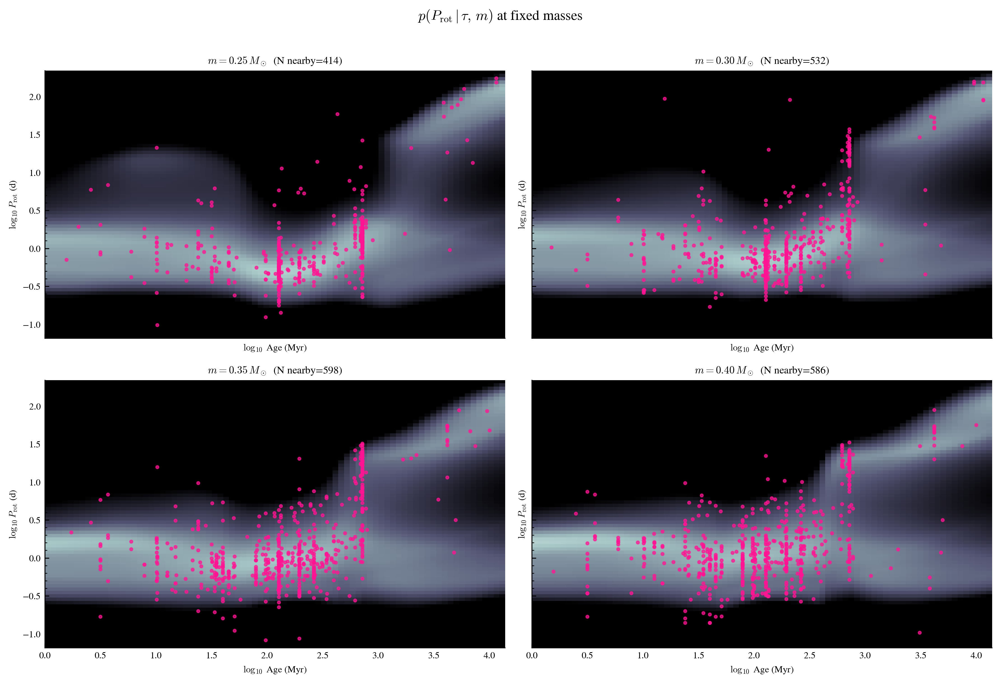

In [18]:
# 8a. Fixed-mass heatmap zoomed to FC boundary masses
plot_fixed_mass_heatmap(
    fold_flows, train_val_df, COND_COLS, fold_scalers,
    masses   = [0.25, 0.30, 0.35, 0.40],
    mass_tol = 0.03,
)

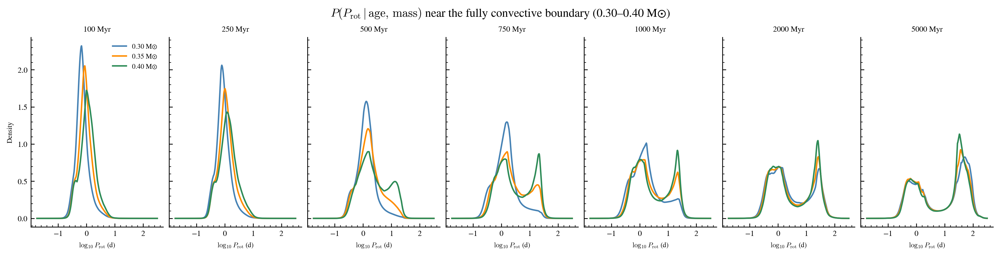

In [19]:
# 8b. P_rot PDFs at representative ages for FC-boundary stars
_fc_ages_myr = [100, 250, 500, 750, 1000, 2000, 5000]
_fc_masses   = [0.30, 0.35, 0.40]
_fc_colors   = ['steelblue', 'darkorange', 'seagreen']

fig, axes = plt.subplots(1, len(_fc_ages_myr), figsize=(14, 3.5),
                          sharey=True, layout='constrained')
for ax, age_myr in zip(axes, _fc_ages_myr):
    for mass, col in zip(_fc_masses, _fc_colors):
        lp, pdf = compute_prot_pdf(fold_flows, fold_scalers, age_myr, mass,
                                    COND_COLS, train_val_df, logprot_fine)
        ax.plot(logprot_fine, pdf, color=col, lw=1.5, label=f'{mass:.2f} M☉')
    ax.set_title(f'{age_myr} Myr', fontsize=8)
    ax.set_xlabel(r'$\log_{10} P_\mathrm{rot}$ (d)', fontsize=7)
axes[0].set_ylabel('Density', fontsize=7)
axes[0].legend(fontsize=7, frameon=False)
fig.suptitle(r'$P(P_\mathrm{rot}\,|\,\mathrm{age,\,mass})$ near the fully convective boundary (0.30–0.40 M☉)')
plt.show()

# this shows the learned rotation period distribution
# for masses near the fully convective boundary
# we look at 5 separate ages, increasing from left to right
# from 100 Myr to 5000 Myr 
# as age increases, the bimodal shape becomes more pronounced
# you can see for younger ages it's more clearly unimodal 
# but at 2000 and 5000 Myr, the rotation distribution is almost cleanly
# bimodal for all masses near the FCB

## 10. Engle 2024 comparison

Engle2024 stars: 228  |  mass 0.10–0.67 M☉  |  age 0.11–9.93 Gyr


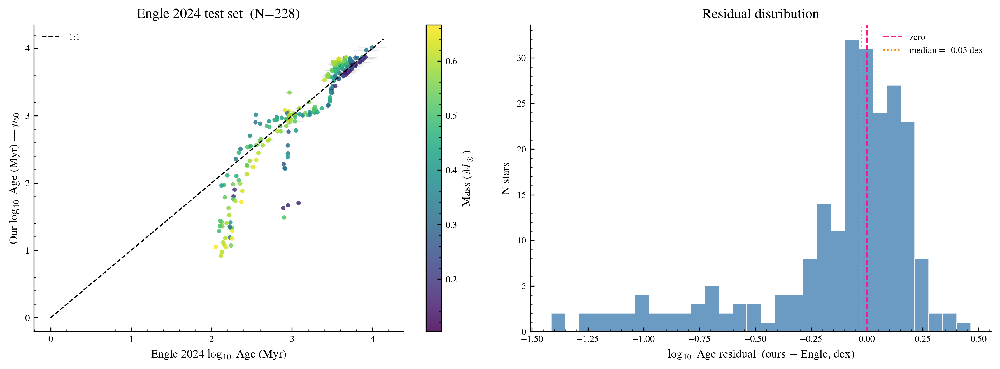


Median residual : -0.025 dex
% within 0.3 dex: 80.3%


In [20]:
# 10. Compare model p50 to Engle's published ages on the held-out Engle2024 test set
engle = pd.read_csv('../../cf_data/test_stars.csv')
engle = engle.dropna(subset=['prot_days','mass_msun','mass_msun_err_lo','mass_msun_err_hi','age_gyr']).copy()
engle['log_prot']    = np.log10(engle['prot_days'])
engle['log_age_myr'] = np.log10(engle['age_gyr'] * 1000.0)
engle = engle.reset_index(drop=True)

print(f'Engle2024 stars: {len(engle)}  |  mass {engle["mass_msun"].min():.2f}–{engle["mass_msun"].max():.2f} M☉  '
      f'|  age {engle["age_gyr"].min():.2f}–{engle["age_gyr"].max():.2f} Gyr')

# Run age inference (fold-averaged posteriors, flat prior)
posts_engle = np.mean([
    batch_posteriors(flow, engle, OBS_COL, COND_COLS, scaler, log_prior_fn=None)
    for flow, scaler in zip(fold_flows, fold_scalers)
], axis=0)
p50_ours = np.array([np.interp(0.5, np.cumsum(p)/np.sum(p), LOGA_GRID) for p in posts_engle])

# Engle's published log_age + asymmetric error bars (convert Gyr → log Myr)
loga_engle  = np.log10(engle['age_gyr'].values * 1000.0)
loga_lo_err = loga_engle - np.log10((engle['age_gyr'].values - engle['age_err_lo_gyr'].values).clip(1e-3) * 1000.0)
loga_hi_err = np.log10((engle['age_gyr'].values + engle['age_err_hi_gyr'].values) * 1000.0) - loga_engle

residual = p50_ours - loga_engle

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))

# Left: scatter, p50_ours vs Engle, colored by mass, with Engle error bars in gray
axes[0].errorbar(loga_engle, p50_ours,
                  xerr=[loga_lo_err, loga_hi_err],
                  fmt='none', ecolor='lightgray', alpha=0.5, lw=0.6, zorder=1)
sc = axes[0].scatter(loga_engle, p50_ours, c=engle['mass_msun'],
                     cmap='viridis', s=14, alpha=0.85, linewidths=0, zorder=2)
lo, hi = LOGA_GRID[0], LOGA_GRID[-1]
axes[0].plot([lo, hi], [lo, hi], 'k--', lw=1, label='1:1')
axes[0].set_xlabel(r'Engle 2024 $\log_{10}$ Age (Myr)')
axes[0].set_ylabel(r'Our $\log_{10}$ Age (Myr) — $p_{50}$')
axes[0].set_title(f'Engle 2024 test set  (N={len(engle)})')
axes[0].legend(frameon=False)
plt.colorbar(sc, ax=axes[0], label=r'Mass ($M_\odot$)')

# Right: residual histogram
axes[1].hist(residual, bins=30, color='steelblue', alpha=0.8, edgecolor='white', lw=0.4)
axes[1].axvline(0, color='deeppink', lw=1.2, ls='--', label='zero')
axes[1].axvline(np.median(residual), color='darkorange', lw=1.2, ls=':',
                 label=f'median = {np.median(residual):+.2f} dex')
axes[1].set_xlabel(r'$\log_{10}$ Age residual  (ours $-$ Engle, dex)')
axes[1].set_ylabel('N stars')
axes[1].set_title('Residual distribution')
axes[1].legend(frameon=False, fontsize=8)

plt.tight_layout()
plt.show()

print(f'\nMedian residual : {np.median(residual):+.3f} dex')
print(f'% within 0.3 dex: {(np.abs(residual) < 0.3).mean()*100:.1f}%')

# plot their prescription over chronoflow density plot and compare


In [21]:
# use logarithmic spacing between ages 
# plots in absolute color space
# dividing up in bins of absolute magnitude rather than mass